*Working as a single .ipynb in Colab*



---



**Working with customer review,**
- understanding why reviews actually matter, and how can we use then effectively
- preprocessing-> visualization -> sentiment analysis -> aspect level sentiment analyis
- filtering out important reviews, like working on them/solving those problem gives us highest ROI.

# Why Customer Reviews actually Matter? How can a company grow using these reviews effectively?

In today's competitive business environment, customer feedback plays a crucial role in shaping the quality of service and driving continuous improvement. Gathering, analyzing, and implementing feedback isn't just about fixing problems—it's about fostering a customer-centric culture that ensures long-term success. (read more :[The Role of Customer Feedback in Service Improvement](https://www.linkedin.com/pulse/role-customer-feedback-service-improvement-netish-sharma-iwv4c/))

[Do companies take customer reviews seriously?](https://www.quora.com/Do-companies-take-customer-reviews-seriously)

[Why Online Reviews are Important for Customers & Businesses](https://terakeet.com/blog/online-reviews/)

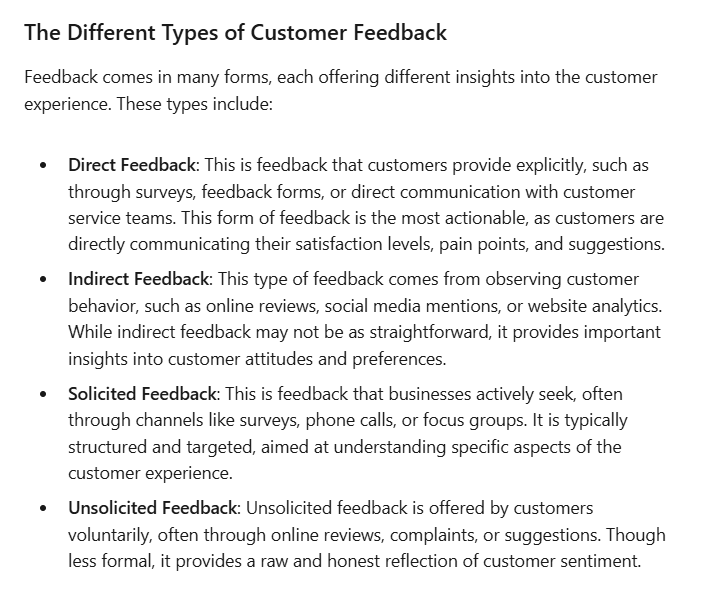

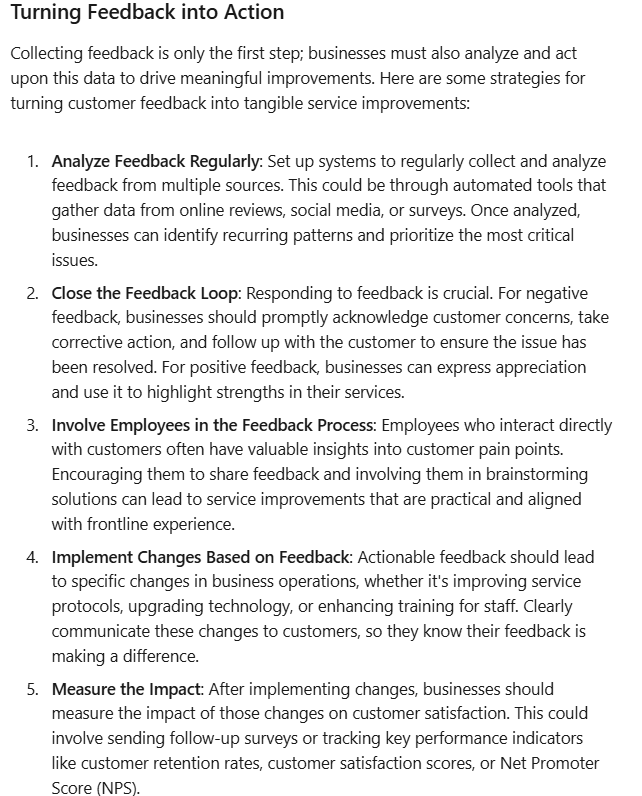

# Preprocessing

In [ ]:
import pandas as pd
df = pd.read_csv('/content/Customer_support_data.csv')

In [ ]:
df

/usr/local/lib/python3.11/dist-packages/google/colab/_dataframe_summarizer.py:88: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  cast_date_col = pd.to_datetime(column, errors="coerce")


,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,Outcall,Product Queries,Life Insurance,NaN,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaN,01/08/2023 11:13,01/08/2023 11:47,01-Aug-23,NaN,NaN,NaN,NaN,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,Outcall,Product Queries,Product Specific Information,NaN,d406b0c7-ce17-4654-b9de-f08d421254bd,NaN,01/08/2023 12:52,01/08/2023 12:54,01-Aug-23,NaN,NaN,NaN,NaN,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,200814dd-27c7-4149-ba2b-bd3af3092880,Inbound,Order Related,Installation/demo,NaN,c273368d-b961-44cb-beaf-62d6fd6c00d5,NaN,01/08/2023 20:16,01/08/2023 20:38,01-Aug-23,NaN,NaN,NaN,NaN,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,eb0d3e53-c1ca-42d3-8486-e42c8d622135,Inbound,Returns,Reverse Pickup Enquiry,NaN,5aed0059-55a4-4ec6-bb54-97942092020a,NaN,01/08/2023 20:56,01/08/2023 21:16,01-Aug-23,NaN,NaN,NaN,NaN,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,ba903143-1e54-406c-b969-46c52f92e5df,Inbound,Cancellation,Not Needed,NaN,e8bed5a9-6933-4aff-9dc6-ccefd7dcde59,NaN,01/08/2023 10:30,01/08/2023 10:32,01-Aug-23,NaN,NaN,NaN,NaN,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85902,505ea5e7-c475-4fac-ac36-1d19a4cb610f,Inbound,Refund Related,Refund Enquiry,NaN,1b5a2b9c-a95f-405f-a42e-5b1b693f3dc9,NaN,30/08/2023 23:20,31/08/2023 07:22,31-Aug-23,NaN,NaN,NaN,NaN,Brandon Leon,Ethan Tan,William Kim,On Job Training,Morning,4
85903,44b38d3f-1523-4182-aba2-72917586647c,Inbound,Order Related,Seller Cancelled Order,Supported team customer executive good,d0e8a817-96d5-4ace-bb82-adec50398e22,NaN,31/08/2023 08:15,31/08/2023 08:17,31-Aug-23,NaN,NaN,NaN,NaN,Linda Foster,Noah Patel,Emily Chen,>90,Morning,5
85904,723bce2c-496c-4aa8-a64b-ca17004528f0,Inbound,Order Related,Order status enquiry,need to improve with proper details.,bdefe788-ccec-4eda-8ca4-51045e68db8a,NaN,31/08/2023 18:57,31/08/2023 19:02,31-Aug-23,NaN,NaN,NaN,NaN,Kimberly Martinez,Aiden Patel,Olivia Tan,On Job Training,Evening,5
85905,707528ee-6873-4192-bfa9-a491f1c08ab5,Inbound,Feedback,UnProfessional Behaviour,NaN,a031ec28-0c5e-450e-95b2-592342c40bc4,NaN,31/08/2023 19:59,31/08/2023 20:00,31-Aug-23,NaN,NaN,NaN,NaN,Daniel Martin,Olivia Suzuki,Olivia Tan,>90,Morning,4


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download once
nltk.download('punkt_tab')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Define the preprocessing function
def preprocess_text(text):
    text = str(text).lower()  # lowercase and ensure string
    text = re.sub(r'[\[\](){}]', ' ', text)         # remove brackets
    text = re.sub(r'[^\w\s]', ' ', text)            # remove punctuation (keep words and whitespace)
    text = re.sub(r'\s+', ' ', text).strip()        # remove extra whitespace

    tokens = word_tokenize(text)                    # tokenize
    tokens = [word for word in tokens if word not in stop_words]  # remove stopwords
    return ' '.join(tokens)

                                     Customer Remarks cleaned_remarks
0                                                 NaN           false
1                                                 NaN           false
2                                                 NaN           false
3                                                 NaN           false
4                                                 NaN           false
5                                                 NaN           false
6                                                 NaN           false
7                                           Very good            true
8   Shopzilla app and it's all coustomer care serv...            true
9                                                 NaN           false
10                                                NaN           false
11                                           Very bad            true


In [ ]:
df = df[df['Customer Remarks'].notna()][['Customer Remarks', 'CSAT Score']]

In [ ]:
df

,Customer Remarks,CSAT Score
7,Very good,5
8,Shopzilla app and it's all coustomer care serv...,5
11,Very bad,1
17,Something,3
19,All good,5
...,...,...
85887,If the customer care guy and their supervisors...,1
85888,Good my problem was solved,5
85896,Trough the Shopzilla App Refunding Policy shou...,5
85903,Supported team customer executive good,5


In [ ]:
pd.set_option('display.max_colwidth',None)
pd.set_option('display.max_rows',None)

In [ ]:
df['cleaned_remarks'] = df['Customer Remarks'].apply(preprocess_text)
df[:100]

,Customer Remarks,CSAT Score,cleaned_remarks
7,Very good,5,good
8,Shopzilla app and it's all coustomer care services is very good service provided all time,5,shopzilla app coustomer care services good service provided time
11,Very bad,1,bad
17,Something,3,something
19,All good,5,good
21,Good,5,good
23,Godd job,5,godd job
25,Issue not resolved pathetic service,1,issue resolved pathetic service
27,Excellent,5,excellent
29,Very good,4,good


Stopwords include "not" due to which meaning gets completely changes, sometimes; we might need other library or handle this.

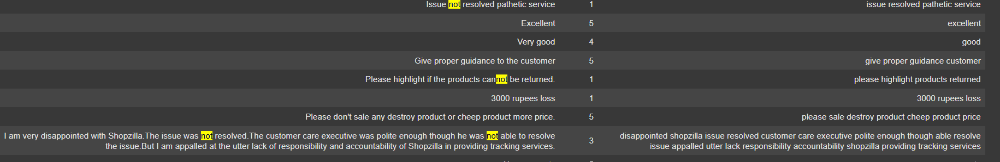

In [ ]:
# Remove negation-related words from stopword list
negation_words = {'not', 'no', 'nor', 'never', 'none', "don't", "wasn't", "isn't", "shouldn't", "wouldn't"}
stop_words = stop_words.difference(negation_words)

In [ ]:
# Define the preprocessing function
def preprocess_text(text):
    text = str(text).lower()  # lowercase and ensure string
    text = re.sub(r'[\[\](){}]', ' ', text)         # remove brackets
    text = re.sub(r'[^\w\s]', ' ', text)            # remove punctuation (keep words and whitespace)
    text = re.sub(r'\s+', ' ', text).strip()        # remove extra whitespace

    tokens = word_tokenize(text)                    # tokenize
    tokens = [word for word in tokens if word not in stop_words]  # remove stopwords
    return ' '.join(tokens)

df['cleaned_remarks'] = df['Customer Remarks'].apply(preprocess_text)
df[:100]

,Customer Remarks,CSAT Score,cleaned_remarks
7,Very good,5,good
8,Shopzilla app and it's all coustomer care services is very good service provided all time,5,shopzilla app coustomer care services good service provided time
11,Very bad,1,bad
17,Something,3,something
19,All good,5,good
21,Good,5,good
23,Godd job,5,godd job
25,Issue not resolved pathetic service,1,issue not resolved pathetic service
27,Excellent,5,excellent
29,Very good,4,good


Issue resolved after changing the stop words list in

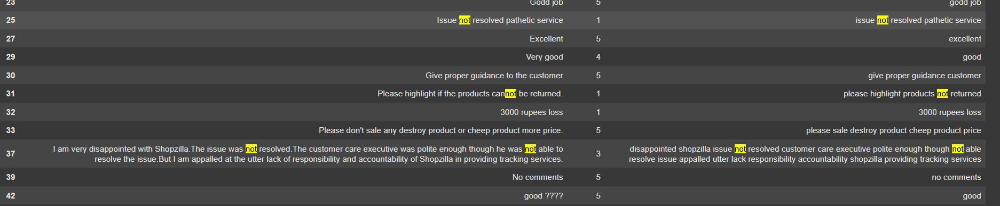

In [ ]:
df = df.drop('Customer Remarks', axis = 1)
df.to_csv('cleaned_review.csv',index=False)

# Visualizations

In [ ]:
import pandas as pd
df = pd.read_csv('/content/cleaned_review.csv')
df

,CSAT Score,cleaned_remarks
0,5,good
1,5,shopzilla app coustomer care services good ser...
2,1,bad
3,3,something
4,5,good
...,...,...
28737,1,customer care guy supervisors not authority an...
28738,5,good problem solved
28739,5,trough shopzilla app refunding policy easier s...
28740,5,supported team customer executive good


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28742 entries, 0 to 28741
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   CSAT Score       28742 non-null  int64 
 1   cleaned_remarks  28222 non-null  object
 2   word_count       28742 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 673.8+ KB


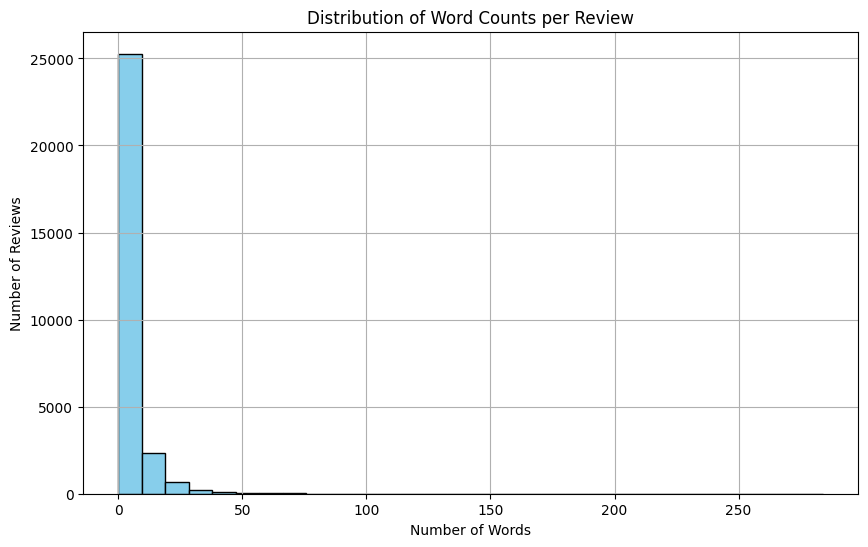

In [ ]:
# Count number of words per review
df['word_count'] = df['cleaned_remarks'].fillna('').apply(lambda x: len(x.split()))

# Plot histogram of word counts
plt.figure(figsize=(10, 6))
plt.hist(df['word_count'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Word Counts per Review')
plt.xlabel('Number of Words')
plt.ylabel('Number of Reviews')
plt.grid(True)
plt.show()

In [ ]:
df.describe()

,CSAT Score,word_count
count,28742.000000,28742.000000
mean,4.073238,4.711920
std,1.560075,7.667317
min,1.000000,0.000000
25%,4.000000,1.000000
50%,5.000000,2.000000
75%,5.000000,5.000000
max,5.000000,284.000000


So the max token length is 284. This is an important paramerter to note, since distilbert only allows 512 tokens rest are truncated.

In [ ]:
positive_df = df[df['CSAT Score'].isin([4,5])]
neutral_df  =  df[df['CSAT Score']==3]
negative_df = df[df['CSAT Score'].isin([1,2])]

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

# make the word cloud
def plt_wordcloud(text, title):

  text = text.fillna('').astype(str)
  all_text = ' '.join(text)

  wordcloud = WordCloud(width = 400, height= 200, background_color='black').generate(all_text)

  plt.figure(figsize=(10,6))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(title)
  plt.show()

# get most occuring words
def get_top_words(text, top_n = 10):

  all_text = ' '.join(text.astype(str))

  words = all_text.split()
  words_count = Counter(words)
  top_words = words_count.most_common(top_n)

  return pd.DataFrame(top_words, columns=['Words','Frequency'])

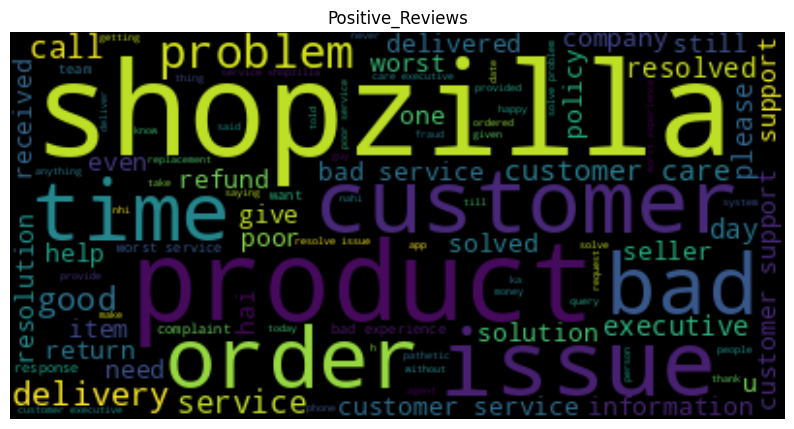

In [ ]:
plt_wordcloud(negative_df['cleaned_remarks'], "Positive_Reviews")

In [ ]:
get_top_words(negative_df['cleaned_remarks'], 10)

,Words,Frequency
0,not,1929
1,shopzilla,1232
2,customer,1129
3,service,961
4,product,863
5,bad,653
6,issue,617
7,no,583
8,delivery,543
9,order,510


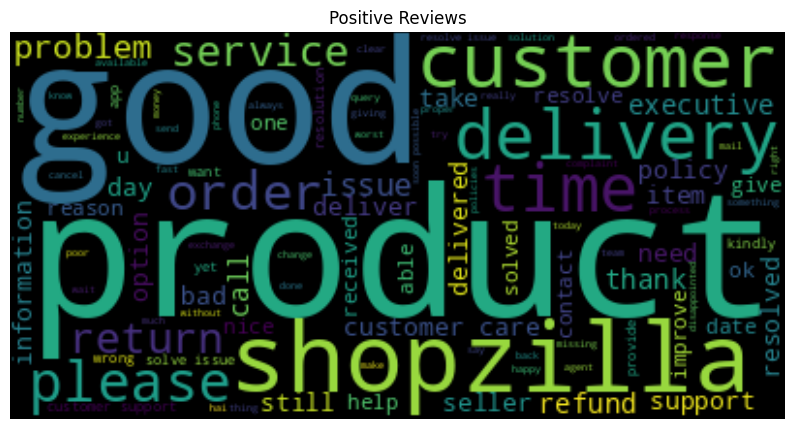

In [ ]:
plt_wordcloud(neutral_df['cleaned_remarks'], "Positive Reviews")

In [ ]:
get_top_words(neutral_df['cleaned_remarks'], 10)

,Words,Frequency
0,not,179
1,good,114
2,customer,111
3,shopzilla,105
4,product,105
5,delivery,92
6,please,67
7,time,64
8,return,60
9,issue,57


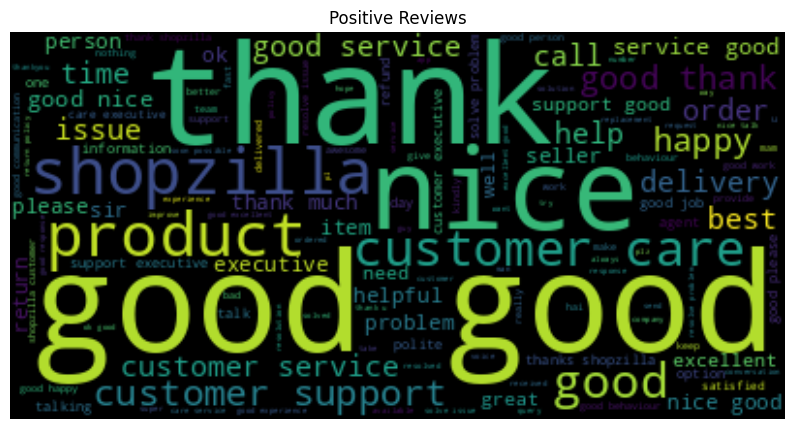

In [ ]:
plt_wordcloud(positive_df['cleaned_remarks'], "Positive Reviews")

In [ ]:
get_top_words(positive_df['cleaned_remarks'], 10)

,Words,Frequency
0,good,7814
1,customer,2548
2,nice,1861
3,shopzilla,1573
4,thank,1519
5,service,1482
6,thanks,1376
7,support,1229
8,not,1057
9,please,1045


# Modeling Sentiment Analysis


> There are two practical ways to approach this problem:
>
> 1. **Weak Supervision using CSAT Scores**
>    We can begin by using CSAT scores (1–5) to weakly label reviews: scores 4–5 as positive, 1–2 as negative, and 3 as neutral or skip. This provides an initial labeled dataset without manual effort. However, it’s not a perfect solution, since it relies only on numeric scores and not the actual review content.
>    To improve label quality over time, we can apply **active learning**—selecting and manually labeling the most uncertain or ambiguous reviews to refine the model and reduce labeling effort overall.
>
> 2. **Start with Pretrained Sentiment Models**
>    Alternatively, we can use off-the-shelf sentiment analysis models pretrained on customer reviews (e.g. BERT variants). This gives us a strong baseline to assess performance and identify gaps.
>    Here too, **active learning** can help fine-tune or adapt the pretrained models to our domain by focusing manual labeling efforts where the model is least confident.
>
> **Combining both approaches**—starting with weak labels, leveraging pretrained models, and incrementally improving via active learning—can lead to a robust and scalable sentiment analysis pipeline with minimal manual annotation.


---


## Using Pre-Trained Models

In [ ]:
from transformers import pipeline
import pandas as pd

#load sentiment pipeline
pipe = pipeline("text-classification", model="Macromrit/distilbert-finetuned-sentiment-analysis-customer-reviews")

# apply to a sample
df_sample = df['cleaned_remarks'].head(1000)

# analyse sentiments
results = pipe(df_sample.tolist(), truncation = True)

df_sample['finetuned_customer_reviews'] =  [res['label'].lower() for res in results ]

print(df_sample['finetuned_customer_reviews'].value_counts())

TypeError: stat: path should be string, bytes, os.PathLike or integer, not NoneType

In [ ]:
from transformers import pipeline
import pandas as pd

# Load sentiment pipeline
pipe = pipeline("text-classification", model="cardiffnlp/twitter-roberta-base-sentiment-latest")

# Load data
df_sample = df['cleaned_remarks'].fillna('').astype(str).head(1000)

# Apply in batches
results = []
batch_size = 100
for i in range(0, len(df_sample), batch_size):
    batch = df_sample[i:i+batch_size].tolist()
    batch_result = pipe(batch, truncation=True)
    results.extend(batch_result)

# Add results back to DataFrame
df_result = df_sample.reset_index(drop=True).to_frame()
df_result['finetuned_customer_reviews'] = [res['label'].lower() for res in results]

# View label counts
print(df_result['finetuned_customer_reviews'].value_counts())


config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Device set to use cpu
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


finetuned_customer_reviews
positive    523
neutral     258
negative    219
Name: count, dtype: int64


In [ ]:
pd.set_option('display.max_colwidth',None)
pd.set_option('display.max_rows',None)

In [ ]:
df_result

,cleaned_remarks,finetuned_customer_reviews
0,good,positive
1,shopzilla app coustomer care services good service provided time,positive
2,bad,negative
3,something,neutral
4,good,positive
5,good,positive
6,godd job,neutral
7,issue not resolved pathetic service,negative
8,excellent,positive
9,good,positive


# Aspect Based Sentiment Analysis

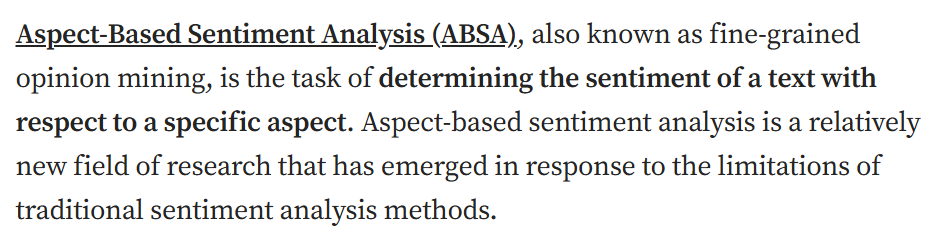

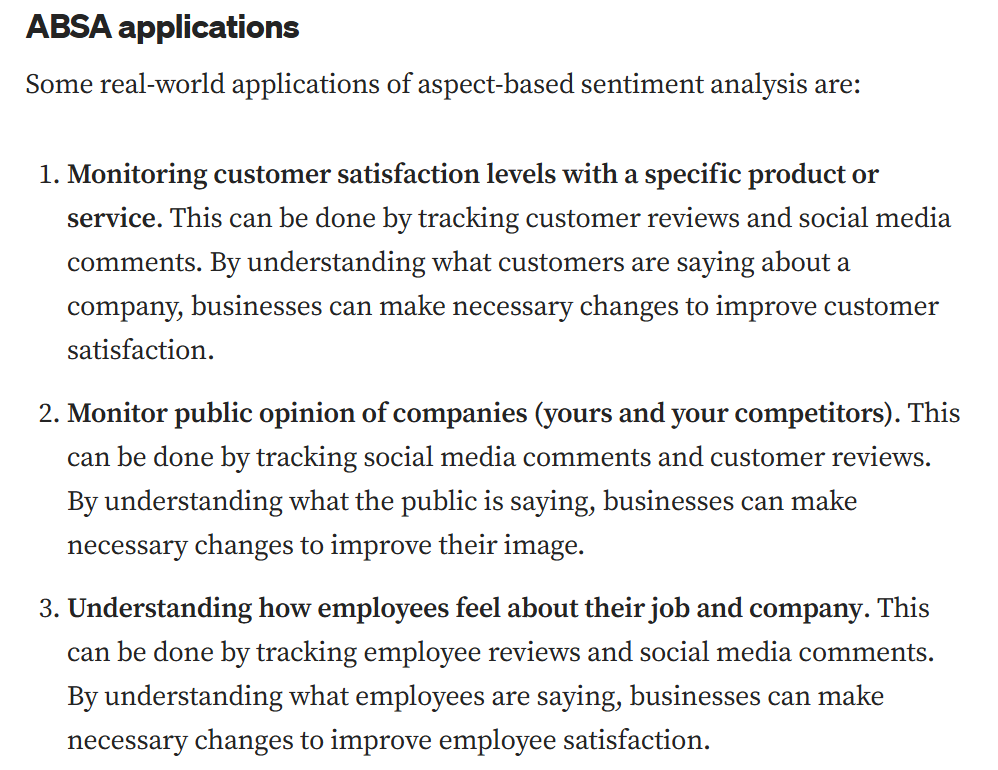

[Know more about ABSA](https://medium.com/nlplanet/quick-intro-to-aspect-based-sentiment-analysis-c8888a09eda7)

For Aspect Level Sentiment Analysis, there can be 2 approaches/possilbities, suprevised and unsupervised. We will try both since we are here to learn.

## Supervised ABSA

Shopzilla, Service, Product, Delivery

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch.nn.functional as F

# Load Aspect-Based Sentiment Analysis model
absa_tokenizer = AutoTokenizer.from_pretrained("yangheng/deberta-v3-base-absa-v1.1")
absa_model = AutoModelForSequenceClassification \
  .from_pretrained("yangheng/deberta-v3-base-absa-v1.1")

/usr/local/lib/python3.11/dist-packages/transformers/convert_slow_tokenizer.py:564: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(


In [ ]:
sentence = "We had a great experience at the restaurant, food was delicious, but " \
  "the service was kinda bad"
print(f"Sentence: {sentence}")
print()

# ABSA of "food"
aspect = "food"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

# ABSA of "service"
aspect = "service"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

Sentence: We had a great experience at the restaurant, food was delicious, but the service was kinda bad

Sentiment of aspect 'food' is:
Label negative: 0.000998911913484335
Label neutral: 0.0018238150514662266
Label positive: 0.997177243232727

Sentiment of aspect 'service' is:
Label negative: 0.9946129322052002
Label neutral: 0.0023699880111962557
Label positive: 0.003017082577571273



In [ ]:
sentence = "I am very disappointed with Shopzilla.The issue was not resolved.The customer care executive was polite enough though he was not able to resolve the issue.But I am appalled at the utter lack of responsibility and accountability of Shopzilla in providing tracking services."
print(f"Sentence: {sentence}")
print()

# ABSA of "shopzilla"
aspect = "shopzilla"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

# ABSA of "customer care"
aspect = "customer care"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

Sentence: I am very disappointed with Shopzilla.The issue was not resolved.The customer care executive was polite enough though he was not able to resolve the issue.But I am appalled at the utter lack of responsibility and accountability of Shopzilla in providing tracking services.

Sentiment of aspect 'shopzilla' is:
Label negative: 0.9946091175079346
Label neutral: 0.0029665250331163406
Label positive: 0.002424296224489808

Sentiment of aspect 'customer care' is:
Label negative: 0.14453405141830444
Label neutral: 0.01826854608952999
Label positive: 0.837197482585907



In [ ]:
sentence = "Shopzilla customer service executive was very helpful,I appreciate her to good future ahead in your company."
print(f"Sentence: {sentence}")
print()

# ABSA of "Shopzilla"
aspect = "SHOPZILLA"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

# ABSA of "phone"
aspect = "phone"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

# ABSA of "food"
aspect = "food"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
probs = F.softmax(outputs.logits, dim=1)
probs = probs.detach().numpy()[0]
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob}")
print()

Sentence: Shopzilla customer service executive was very helpful,I appreciate her to good future ahead in your company.

Sentiment of aspect 'SHOPZILLA' is:
Label negative: 0.00636500958353281
Label neutral: 0.17253120243549347
Label positive: 0.8211037516593933

Sentiment of aspect 'phone' is:
Label negative: 0.006382910069078207
Label neutral: 0.7311903834342957
Label positive: 0.2624267041683197

Sentiment of aspect 'food' is:
Label negative: 0.007546491455286741
Label neutral: 0.849711000919342
Label positive: 0.14274249970912933



In [ ]:
sentence = "Worst Shopzilla customer service. Shopzilla shouldn't cancel order without ack from customer and also there's no compensation for customer satisfiaction. it makes us to move out from Shopzilla."
print(f"Sentence: {sentence}")
print()

# ABSA of "food"
aspect = "food"
inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
outputs = absa_model(**inputs)
print(outputs)
print(outputs.logits.shape)
probs = F.softmax(outputs.logits, dim=1)
print(probs)
probs = probs.detach().numpy()[0]
print(probs)
print(f"Sentiment of aspect '{aspect}' is:")
for prob, label in zip(probs, ["negative", "neutral", "positive"]):
  print(f"Label {label}: {prob:0.2f}")       # use 0.2f if you don't need high precision....
print()


Sentence: Worst Shopzilla customer service. Shopzilla shouldn't cancel order without ack from customer and also there's no compensation for customer satisfiaction. it makes us to move out from Shopzilla.

SequenceClassifierOutput(loss=None, logits=tensor([[ 1.6892,  0.7580, -1.8979]], grad_fn=<AddmmBackward0>), hidden_states=None, attentions=None)
torch.Size([1, 3])
tensor([[0.7034, 0.2772, 0.0195]], grad_fn=<SoftmaxBackward0>)
[0.70335215 0.27717894 0.01946894]
Sentiment of aspect 'food' is:
Label negative: 0.70
Label neutral: 0.28
Label positive: 0.02



**Working on Aspect "Shopzilla"**

In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch.nn.functional as F
from tqdm import tqdm

# Load Aspect-Based Sentiment Analysis model
absa_tokenizer = AutoTokenizer.from_pretrained("yangheng/deberta-v3-base-absa-v1.1")
absa_model = AutoModelForSequenceClassification \
  .from_pretrained("yangheng/deberta-v3-base-absa-v1.1")

# preparing dataset
df = pd.read_csv("cleaned_review.csv")
shopzilla_df = df[df['cleaned_remarks'].str.contains("shopzilla", case = False, na = False)].copy()
shopzilla_df

/usr/local/lib/python3.11/dist-packages/transformers/convert_slow_tokenizer.py:564: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(


,CSAT Score,cleaned_remarks
1,5,shopzilla app coustomer care services good service provided time
14,3,disappointed shopzilla issue not resolved customer care executive polite enough though not able resolve issue appalled utter lack responsibility accountability shopzilla providing tracking services
25,5,keep shopzilla
31,5,way talked quite appropriate nice well shopzilla hire kind executive customer support service bless dear
32,4,please pack products actually customers ordered otherwise time us shopzilla
41,5,please give chance local shop company using name shopzilla giving worst products sell products like myntra myntra always send products
48,1,delete shopzilla account
65,1,worst shopzilla customer service shopzilla cancel order without ack customer also no compensation customer satisfiaction makes us move shopzilla
68,5,shopzilla customer service executive helpful appreciate good future ahead company
73,1,played around order without taking customers concern plan resolution pick products brain check customers availability also no courtesy atleast reach customer apologize mess created shopzilla due systems failure order placed 8 july 19 july damaged product delivered still awaiting resolution refund


Let's work on work first 300 rows only... that's enough to understand the concepts

In [ ]:
# 2. Define sentiment labels ( model output classes )
sentiment_labels = ["negative", "neutral", "positive"]

# 3. Apply ABSA on each filtered sentence
sentiments = []
aspect = "shopzilla"

for sentence in tqdm(shopzilla_df["cleaned_remarks"][:300], desc="ABSA Progress"):
    # Tokenize with aspect format
    inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
    outputs = absa_model(**inputs)

    # Convert logits to probabilities
    probs = F.softmax(outputs.logits, dim=1)
    probs = probs.detach().numpy()[0]

    # Get index of max prob → sentiment
    sentiment = sentiment_labels[probs.argmax()]
    sentiments.append(sentiment)

shopzilla_df.loc[shopzilla_df.index[:300], "absa_sentiments"] = sentiments

shopzilla_df["absa_sentiments"][:300].value_counts(normalize = True)*100

ABSA Progress: 100%|██████████| 300/300 [05:36<00:00,  1.12s/it]


,proportion
absa_sentiments,
negative,54.666667
positive,37.333333
neutral,8.000000


In [ ]:
pd.set_option('display.max_colwidth',None)
pd.set_option('display.max_rows',None)
shopzilla_df[:300]

,CSAT Score,cleaned_remarks,absa_sentiments
1,5,shopzilla app coustomer care services good service provided time,positive
14,3,disappointed shopzilla issue not resolved customer care executive polite enough though not able resolve issue appalled utter lack responsibility accountability shopzilla providing tracking services,negative
25,5,keep shopzilla,positive
31,5,way talked quite appropriate nice well shopzilla hire kind executive customer support service bless dear,positive
32,4,please pack products actually customers ordered otherwise time us shopzilla,negative
41,5,please give chance local shop company using name shopzilla giving worst products sell products like myntra myntra always send products,negative
48,1,delete shopzilla account,negative
65,1,worst shopzilla customer service shopzilla cancel order without ack customer also no compensation customer satisfiaction makes us move shopzilla,negative
68,5,shopzilla customer service executive helpful appreciate good future ahead company,positive
73,1,played around order without taking customers concern plan resolution pick products brain check customers availability also no courtesy atleast reach customer apologize mess created shopzilla due systems failure order placed 8 july 19 july damaged product delivered still awaiting resolution refund,negative


**Working on Aspect "Delivery"**

In [ ]:
# preparing dataset
df = pd.read_csv("cleaned_review.csv")
delivery_df = df[df['cleaned_remarks'].str.contains("delivery", case = False, na = False)].copy()
delivery_df[:100]

,CSAT Score,cleaned_remarks
85,4,item delay delivery date
98,1,delivery product take responsibility items
153,5,delivery check products properly not delivered wrong item like defective broken ordered allmost 50 order orders delivered properly others defective using sometime not working properly
163,4,return request done delivery partner not picked order request return automatically cancelled shopzilla not good thing customer like one please make sure type issues not occur
164,1,received product still delivery boy shown delivered see communication gap status updated
247,1,wrost service nobody resolvoed without deliverying product delivery agent updating product delivered absolutely wrong data leakaging without asking pin updated like shows till date unable connect also
254,1,ordered 27th expected delivery 29th put delivery 30th no call gets undelivereddelivery agent confirms address 31st pick call marks undeliveredon 1st gets undelivered without callon 2nd gets cancelledyour called senior support agent absolutely horrible even ridiculed pronuncing name end rating service not service pathetic agents terrible service experience
267,1,give option faster delivery
273,5,try fix delivery hours uncertain delivery person arrive whole day sometimes arrive busy hours becomes difficut receive order recepient informed approximate delivery time
294,1,product cancelled without information got feed u rehected delivery


In [ ]:
from tqdm import tqdm

# Define sentiment labels
sentiment_labels = ["negative", "neutral", "positive"]
sentiments = []
aspect = "delivery"

# Wrap your loop with tqdm for progress bar
for sentence in tqdm(delivery_df["cleaned_remarks"][:300], desc="ABSA Progress"):
    inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
    outputs = absa_model(**inputs)

    probs = F.softmax(outputs.logits, dim=1)
    probs = probs.detach().numpy()[0]
    sentiment = sentiment_labels[probs.argmax()]
    sentiments.append(sentiment)

# Assign the sentiments back
delivery_df.loc[delivery_df.index[:300], "absa_sentiments"] = sentiments

delivery_df["absa_sentiments"][:300].value_counts(normalize = True)*100

ABSA Progress: 100%|██████████| 300/300 [05:25<00:00,  1.08s/it]


,proportion
absa_sentiments,
negative,66.666667
positive,26.333333
neutral,7.000000


In [ ]:
delivery_df[:300]

,CSAT Score,cleaned_remarks,absa_sentiments
85,4,item delay delivery date,negative
98,1,delivery product take responsibility items,negative
153,5,delivery check products properly not delivered wrong item like defective broken ordered allmost 50 order orders delivered properly others defective using sometime not working properly,negative
163,4,return request done delivery partner not picked order request return automatically cancelled shopzilla not good thing customer like one please make sure type issues not occur,negative
164,1,received product still delivery boy shown delivered see communication gap status updated,negative
247,1,wrost service nobody resolvoed without deliverying product delivery agent updating product delivered absolutely wrong data leakaging without asking pin updated like shows till date unable connect also,negative
254,1,ordered 27th expected delivery 29th put delivery 30th no call gets undelivereddelivery agent confirms address 31st pick call marks undeliveredon 1st gets undelivered without callon 2nd gets cancelledyour called senior support agent absolutely horrible even ridiculed pronuncing name end rating service not service pathetic agents terrible service experience,negative
267,1,give option faster delivery,positive
273,5,try fix delivery hours uncertain delivery person arrive whole day sometimes arrive busy hours becomes difficut receive order recepient informed approximate delivery time,negative
294,1,product cancelled without information got feed u rehected delivery,negative


**Working on Aspect "Service"**

In [ ]:
# preparing dataset
df = pd.read_csv("cleaned_review.csv")
service_df = df[df['cleaned_remarks'].str.contains("service", case = False, na = False)].copy()

# Define sentiment labels
sentiment_labels = ["negative", "neutral", "positive"]
sentiments = []
aspect = "service"

# Wrap your loop with tqdm for progress bar
for sentence in tqdm(service_df["cleaned_remarks"][:300], desc="ABSA Progress"):
    inputs = absa_tokenizer(f"[CLS] {sentence} [SEP] {aspect} [SEP]", return_tensors="pt")
    outputs = absa_model(**inputs)

    probs = F.softmax(outputs.logits, dim=1)
    probs = probs.detach().numpy()[0]
    sentiment = sentiment_labels[probs.argmax()]
    sentiments.append(sentiment)

# Assign the sentiments back
service_df.loc[service_df.index[:300], "absa_sentiments"] = sentiments

service_df["absa_sentiments"][:300].value_counts(normalize = True)*100

ABSA Progress: 100%|██████████| 300/300 [05:27<00:00,  1.09s/it]


,proportion
absa_sentiments,
positive,52.666667
negative,45.000000
neutral,2.333333


In [ ]:
service_df[:300]

,CSAT Score,cleaned_remarks,absa_sentiments
1,5,shopzilla app coustomer care services good service provided time,positive
7,1,issue not resolved pathetic service,negative
14,3,disappointed shopzilla issue not resolved customer care executive polite enough though not able resolve issue appalled utter lack responsibility accountability shopzilla providing tracking services,negative
17,5,customer service number plz available,neutral
31,5,way talked quite appropriate nice well shopzilla hire kind executive customer support service bless dear,positive
39,1,selected english language preference goes hindi channel customer service executive understand english properly,positive
50,1,poor service support,negative
54,1,no response ordervery bad costumer service,negative
65,1,worst shopzilla customer service shopzilla cancel order without ack customer also no compensation customer satisfiaction makes us move shopzilla,negative
68,5,shopzilla customer service executive helpful appreciate good future ahead company,positive


## Unsupervised ABSA

# How to filter out important reviews, and decide solving which one gives us gives highest ROI

# Next step: Work on real scraped data: on a latest product ____ and use this to get an intern/ job